In [1]:
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
import matplotlib.pyplot as plt
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)
import json # library to handle JSON files
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
import requests # library to handle requests
from bs4 import BeautifulSoup # library to parse HTML and XML documents
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
# import k-means from clustering stage

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

#!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library
import branca

print("Libraries imported.")

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    openssl-1.1.1d             |       h516909a_0         2.1 MB  conda-forge
    folium-0.5.0               |             py_0          45 KB  conda-forge
    vincent-0.4.4              |             py_1          28 KB  conda-forge
    branca-0.3.1               |             py_0          25 KB  conda-forge
    ca-certificates-2019.11.28 |       hecc5488_0         145 KB  conda-forge
    altair-4.0.1               |             py_0         575 KB  conda-forge
    certifi-2019.11.28         |           py36_0         149 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         3.0 MB

The following NEW packages will be 

In [2]:
df = pd.read_csv('https://datos.cdmx.gob.mx/explore/dataset/coloniascdmx/download/?format=csv&timezone=America/Mexico_City&use_labels_for_header=true&csv_separator=%2C') # download data and create dataframe
print('CSV file downloaded!')

CSV file downloaded!


In [3]:
df.head() # show the first five rows of the dataframe

,COLONIA,ENTIDAD,Geo Point,Geo Shape,CVE_ALC,ALCALDIA,CVE_COL,SECC_COM,SECC_PAR
0,IRRIGACION,9.0,"19.4429549298,-99.2099357048","{""type"": ""Polygon"", ""coordinates"": [[[-99.2115...",16,MIGUEL HIDALGO,16-035,"5079, 5080, 5083, 5102","5068, 5082"
1,MARINA NACIONAL (U HAB),9.0,"19.4466319056,-99.1795110575","{""type"": ""Polygon"", ""coordinates"": [[[-99.1797...",16,MIGUEL HIDALGO,16-049,"5137, 5182",NaN
2,PEDREGAL DE STO DOMINGO VI,9.0,"19.3234027183,-99.1654676133","{""type"": ""Polygon"", ""coordinates"": [[[-99.1622...",3,COYOACAN,03-144,"381, 394, 494, 416, 417, 439",NaN
3,VILLA PANAMERICANA 7MA. SECCIN (U HAB),9.0,"19.304604269,-99.1677617231","{""type"": ""Polygon"", ""coordinates"": [[[-99.1676...",3,COYOACAN,03-121,NaN,"474, 475"
4,VILLA PANAMERICANA 6TA. SECCIN (U HAB),9.0,"19.3112238873,-99.1696478642","{""type"": ""Polygon"", ""coordinates"": [[[-99.1702...",3,COYOACAN,03-120,NaN,458


In [4]:
df.shape # return the dimensions of the dataframe

(1812, 9)

In [5]:
# clean up the dataset to remove unnecessary columns
df.drop(['ENTIDAD','Geo Shape','SECC_COM','SECC_PAR'], axis=1, inplace=True)

# rename the columns so that they make sense
df.rename(columns={'CVE_COL':'NbhdNumber', 'COLONIA':'Neighborhood', 'ALCALDIA':'Borough','CVE_ALC':'BorNumber'}, inplace=True)

# for sake of consistency, let's also make all column labels of type string
df.columns = list(map(str, df.columns))

# show the first five rows of the dataframe
df.head()

,Neighborhood,Geo Point,BorNumber,Borough,NbhdNumber
0,IRRIGACION,"19.4429549298,-99.2099357048",16,MIGUEL HIDALGO,16-035
1,MARINA NACIONAL (U HAB),"19.4466319056,-99.1795110575",16,MIGUEL HIDALGO,16-049
2,PEDREGAL DE STO DOMINGO VI,"19.3234027183,-99.1654676133",3,COYOACAN,03-144
3,VILLA PANAMERICANA 7MA. SECCIN (U HAB),"19.304604269,-99.1677617231",3,COYOACAN,03-121
4,VILLA PANAMERICANA 6TA. SECCIN (U HAB),"19.3112238873,-99.1696478642",3,COYOACAN,03-120


In [6]:
# new data frame with split value columns 
coord = df["Geo Point"].str.split(",", n = 1, expand = True)

# separate columns from new data frame 
df["Latitude"]= coord[0]
df["Longitude"]= coord[1]

# convert data types
df = df.convert_objects(convert_numeric=True)

# drop old coordinate columns 
df.drop(columns =["Geo Point"], inplace = True)

# reorder columns 
df = df[['NbhdNumber', 'Neighborhood', 'Latitude','Longitude', 'Borough', 'BorNumber']]

# show the first five rows of the dataframe
df.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:9: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


,NbhdNumber,Neighborhood,Latitude,Longitude,Borough,BorNumber
0,16-035,IRRIGACION,19.442955,-99.209936,MIGUEL HIDALGO,16
1,16-049,MARINA NACIONAL (U HAB),19.446632,-99.179511,MIGUEL HIDALGO,16
2,03-144,PEDREGAL DE STO DOMINGO VI,19.323403,-99.165468,COYOACAN,3
3,03-121,VILLA PANAMERICANA 7MA. SECCIN (U HAB),19.304604,-99.167762,COYOACAN,3
4,03-120,VILLA PANAMERICANA 6TA. SECCIN (U HAB),19.311224,-99.169648,COYOACAN,3


In [7]:
df.shape

(1812, 6)

In [8]:
df.isnull().sum()

NbhdNumber      0
Neighborhood    0
Latitude        4
Longitude       4
Borough         0
BorNumber       0
dtype: int64

In [9]:
df = df.drop(df[df.isnull().any(axis=1)].index).reset_index(drop=True)

In [10]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(df['Borough'].unique()),
        df.shape[0]
    )
)

The dataframe has 16 boroughs and 1808 neighborhoods.


In [11]:
geolocator = Nominatim(user_agent="explorer")
location = geolocator.geocode('Mexico City')

# Mexico City latitude and longitude values
latitude = location.latitude
longitude = location.longitude

In [12]:
# create map of Mexico City using latitude and longitude values
cdmx_map = folium.Map(location=[latitude, longitude], tiles='cartodbpositron', zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(df['Latitude'], df['Longitude'], df['Borough'], df['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(cdmx_map)  
    
# display the map of Mexico City
cdmx_map

In [13]:
X = df.values[:,2:4]
X = np.nan_to_num(X)
X_norm = StandardScaler().fit_transform(X)
X_norm

/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


array([[ 0.86272718, -0.96643957],
       [ 0.90860703, -0.52847215],
       [-0.62899785, -0.32631463],
       ...,
       [-0.43148136,  0.28198025],
       [-0.53742414,  0.29752937],
       [ 0.59607429,  0.53903235]])

In [14]:
# Elbow method

K = 16

# function returns WSS score for k values from 1 to kmax
def calculate_WSS(points, kmax):
  sse = []
  for k in range(1, kmax+1):
    kmeans = KMeans(init = "k-means++", n_clusters = k).fit(points)
    centroids = kmeans.cluster_centers_
    pred_clusters = kmeans.predict(points)
    curr_sse = 0
    
    # calculate square of Euclidean distance of each point from its cluster center and add to current WSS
    for i in range(len(points)):
      curr_center = centroids[pred_clusters[i]]
      curr_sse += (points[i, 0] - curr_center[0]) ** 2 + (points[i, 1] - curr_center[1]) ** 2
      
    sse.append(curr_sse)
  return sse

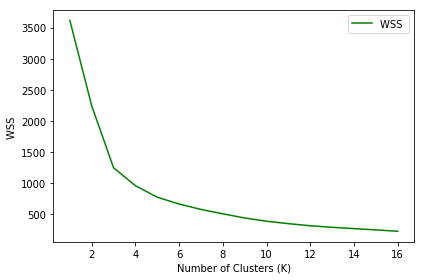

In [15]:
plt.plot(range(1, K+1), calculate_WSS(X_norm, K),'g')
plt.legend(('WSS ', '+/- 3xstd'))
plt.ylabel('WSS ')
plt.xlabel('Number of Clusters (K)')
plt.tight_layout()
plt.show()

In [30]:
kclusters = 4

In [35]:
df_rdc = df.copy()
df_rdc["CityCluster"] = KMeans(init = "k-means++", n_clusters = 4).fit(X_norm).labels_
cityctd = KMeans(init = "k-means++", n_clusters = 4).fit(X).cluster_centers_
df_rdc.head()

,NbhdNumber,Neighborhood,Latitude,Longitude,Borough,BorNumber,CityCluster
0,16-035,IRRIGACION,19.442955,-99.209936,MIGUEL HIDALGO,16,1
1,16-049,MARINA NACIONAL (U HAB),19.446632,-99.179511,MIGUEL HIDALGO,16,1
2,03-144,PEDREGAL DE STO DOMINGO VI,19.323403,-99.165468,COYOACAN,3,0
3,03-121,VILLA PANAMERICANA 7MA. SECCIN (U HAB),19.304604,-99.167762,COYOACAN,3,0
4,03-120,VILLA PANAMERICANA 6TA. SECCIN (U HAB),19.311224,-99.169648,COYOACAN,3,0


In [36]:
# create map
cdmx_map_2 = folium.Map(location=[latitude, longitude], tiles='cartodbpositron', zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, bor, nei, cluster1 in zip(df_rdc['Latitude'], df_rdc['Longitude'], df_rdc['Borough'], df_rdc['Neighborhood'], df_rdc['CityCluster']):
    label = folium.Popup('{}  -  {}  -  Cluster {}'.format(bor, nei, cluster1), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster1-1],
        fill=True,
        fill_color=rainbow[cluster1-1],
        fill_opacity=0.7).add_to(cdmx_map_2)
       
cdmx_map_2

In [38]:
df_rdc.groupby(['CityCluster']).CityCluster.agg('count').to_frame('Count').reset_index()

,CityCluster,Count
0,0,409
1,1,584
2,2,374
3,3,441


In [61]:
cdmx_west = df_rdc[df_rdc['CityCluster'] == 3].reset_index(drop=True)
cdmx_west.head()

,NbhdNumber,Neighborhood,Latitude,Longitude,Borough,BorNumber,CityCluster
0,03-024,COPILCO UNIVERSIDAD,19.336117,-99.182610,COYOACAN,3,3
1,03-019,CHIMALISTAC,19.343797,-99.183682,COYOACAN,3,3
2,10-198,SANTA FE,19.389263,-99.231896,ALVARO OBREGON,10,3
3,10-204,SANTA ROSA XOCHIAC (PBLO),19.325159,-99.289188,ALVARO OBREGON,10,3
4,10-219,TLACOYAQUE,19.321491,-99.265187,ALVARO OBREGON,10,3


In [56]:
# Mexico City west zone latitude and longitude values
latitude_w = cityctd[2,0]
longitude_w = cityctd[2,1]

In [62]:
# create map of Mexico City using latitude and longitude values
cdmx_w_map = folium.Map(location=[latitude_w, longitude_w], tiles='cartodbpositron', zoom_start=11)

# add markers to map
for lat, lng, borough, neighborhood in zip(cdmx_west['Latitude'], cdmx_west['Longitude'], cdmx_west['Borough'], cdmx_west['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(cdmx_w_map)  
    
# display the map of Mexico City
cdmx_w_map

In [64]:
CLIENT_ID = 'RGPXJFOCYCSQUKOTNXDE15L2NMYPD2NAQTBBO5A30MSDJ0SQ' # your Foursquare ID
CLIENT_SECRET = 'CNA1BP3VSMWGP42UO4NQQAZHQ0J0PBV55LN2N2W1JB45L1RI' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: RGPXJFOCYCSQUKOTNXDE15L2NMYPD2NAQTBBO5A30MSDJ0SQ
CLIENT_SECRET:CNA1BP3VSMWGP42UO4NQQAZHQ0J0PBV55LN2N2W1JB45L1RI


In [65]:
LIMIT = 20 # limit of number of venues returned by Foursquare API

radius = 500 # define radius

In [66]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [67]:
cdmx_w_venues = getNearbyVenues(names=cdmx_west['Neighborhood'],
                                   latitudes=cdmx_west['Latitude'],
                                   longitudes=cdmx_west['Longitude']
                                  )

COPILCO UNIVERSIDAD
CHIMALISTAC
SANTA FE
SANTA ROSA XOCHIAC (PBLO)
TLACOYAQUE
RINCON DE LA BOLSA
CORPUS CHRISTY
BEJERO
CANUTILLO PREDIO LA PRESA
BATALLON DE SAN PATRICIO (U HAB)
GOLONDRINAS 2DA SECCION
GRAL C  A  MADRAZO
LADERA GRANDE O LA CEBADITA
LOMAS DE BECERRA ARVIDE (U HAB)
BOSQUES DE LAS LOMAS
LOMAS DE VISTA HERMOSA
1o DE MAYO
SAN PEDRO CUAJIMALPA (PBLO)
HEROES DE PADIERNA
SAN FRANCISCO
SAN BARTOLO AMEYALCO
CAZULCO (BARR)
CREDITO CONSTRUCTOR
CIUDAD DE LOS DEPORTES
AMPLIACION MIGUEL HIDALGO 3A SECC
AGUILAS 3ER PARQUE
ATLAMAYA
BOSQUES DE TARANGO
AVE REAL
AVE REAL (AMPL)
EL BOSQUE 2DA SECCION (AMPL)
EL RODEO
EL BOSQUE
FLORIDA
LA HUERTA
LOMAS DE LA ERA
MERCED GOMEZ
LOMAS DE LAS AGUILAS
MIGUEL HIDALGO
VILLA PROGRESISTA
ZOTOLTITLA
TORRES SAN PEDRO (U HAB)
SAN GABRIEL
TLAPECHICO
OCOTILLOS
TORRES DE POTRERO
CRUZ BLANCA
EL YAQUI
LA PILA
EL GAVILLERO
PUEBLO NUEVO ALTO
PUENTE SIERRA
SAN FRANCISCO (BARR)
VISTA HERMOSA
CENTRO URBANO PRESIDENTE ALEMAN (U HAB)
SAN JOSE INSURGENTES
DEL VALLE IV

In [97]:
print(cdmx_w_venues.shape)
cdmx_w_venues.head()

(5736, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,COPILCO UNIVERSIDAD,19.336117,-99.18261,Tianguis de los Lunes y Viernes de Copilco,19.336810,-99.182003,Taco Place
1,COPILCO UNIVERSIDAD,19.336117,-99.18261,La Casa de Las Mariposas,19.336362,-99.183602,Mexican Restaurant
2,COPILCO UNIVERSIDAD,19.336117,-99.18261,Dragonfly Pole Dancers,19.337389,-99.184584,Athletics & Sports
3,COPILCO UNIVERSIDAD,19.336117,-99.18261,La Cafeta del CUC,19.335595,-99.182070,Coffee Shop
4,COPILCO UNIVERSIDAD,19.336117,-99.18261,Café y Té Quiero,19.335079,-99.179744,Breakfast Spot


In [98]:
cdmx_w_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
16 DE SEPTIEMBRE,15,15,15,15,15,15
19 DE MAYO,7,7,7,7,7,7
1RA VICTORIA,20,20,20,20,20,20
1RA VICTORIA SECCION BOSQUES,20,20,20,20,20,20
1o DE MAYO,1,1,1,1,1,1
2 DE OCTUBRE,3,3,3,3,3,3
26 DE JULIO,8,8,8,8,8,8
2DA JALALPA TEPITO (AMPL),3,3,3,3,3,3
2DA EL PIRUL (AMPL),18,18,18,18,18,18


In [99]:
print('There are {} uniques categories.'.format(len(cdmx_w_venues['Venue Category'].unique())))

There are 291 uniques categories.


In [100]:
# one hot encoding
cdmx_w_onehot = pd.get_dummies(cdmx_w_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
cdmx_w_onehot['Neighborhood'] = cdmx_w_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [cdmx_w_onehot.columns[-1]] + list(cdmx_w_onehot.columns[:-1])
cdmx_w_onehot = cdmx_w_onehot[fixed_columns]

In [101]:
#Rearrange
# Get the DataFrame column names as a list
clist = list(cdmx_w_onehot.columns)

#cdmx_w_onehot.columns.get_loc("Neighborhood")
# Rearrange list the way you like 
clist.insert(0, clist.pop(clist.index('Neighborhood')))   # brings the last column in the first place

# Pass the new list to the DataFrame - like a key list in a dict 
cdmx_w_onehot = cdmx_w_onehot[clist]

cdmx_w_onehot.head()

,Neighborhood,Zoo Exhibit,ATM,Accessories Store,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beer Bar,Beer Garden,Big Box Store,Bike Trail,Bistro,Board Shop,Boarding House,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Car Wash,Casino,Castle,Chinese Restaurant,Church,Circus,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Cafeteria,College Gym,College History Building,College Stadium,Comfort Food Restaurant,Community Center,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Dive Shop,Doctor's Office,Dog Run,Donut Shop,Drugstore,Eastern European Restaurant,Electronics Store,English Restaurant,Event Service,Event Space,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gastropub,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Intersection,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Kebab Restaurant,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Leather Goods Store,Lighthouse,Liquor Store,Lounge,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,National Park,Nature Preserve,New American Restaurant,Nightclub,Office,Optical Shop,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Paintball Field,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Store,Pharmacy,Pie Shop,Pizza Place,Planetarium,Playground,Plaza,Pool,Pool Hall,Print Shop,Professional & Other Places,Pub,Public Art,Racetrack,Record Shop,Recording Studio,Recreation Center,Residential Building (Apartment / Condo),Resort,Restaurant,River,Road,Rock Climbing Spot,Rock Club,Salad Place,Salon / Barbershop,Salsa Club,Sandwich Place,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Skate Park,Ski Area,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stables,Stadium,Stationery Store,Steakhouse,Street Art,Student Center,Supermarket,Sushi Restaurant,Swim School,Swiss Restaurant,Taco Place,Tailor Shop,Tapas Restaurant,Tea Room,Tennis Court,Tex-Mex Restaurant,Theater,Theme Park,Theme Park Ride / Attraction,Theme Restaurant,Toll Plaza,Town,Toy / Game Store,Track,Trail,Travel Lounge,University,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Veterinarian,Warehouse Store,Wine Bar,Winery,Wings Joi

In [106]:
cdmx_w_onehot.shape

(5736, 291)

In [107]:
cdmx_grouped = cdmx_w_onehot.groupby('Neighborhood').mean().reset_index()
cdmx_grouped

,Neighborhood,Zoo Exhibit,ATM,Accessories Store,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beer Bar,Beer Garden,Big Box Store,Bike Trail,Bistro,Board Shop,Boarding House,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Car Wash,Casino,Castle,Chinese Restaurant,Church,Circus,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Cafeteria,College Gym,College History Building,College Stadium,Comfort Food Restaurant,Community Center,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Dive Shop,Doctor's Office,Dog Run,Donut Shop,Drugstore,Eastern European Restaurant,Electronics Store,English Restaurant,Event Service,Event Space,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gastropub,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Intersection,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Kebab Restaurant,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Leather Goods Store,Lighthouse,Liquor Store,Lounge,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,National Park,Nature Preserve,New American Restaurant,Nightclub,Office,Optical Shop,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Paintball Field,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Store,Pharmacy,Pie Shop,Pizza Place,Planetarium,Playground,Plaza,Pool,Pool Hall,Print Shop,Professional & Other Places,Pub,Public Art,Racetrack,Record Shop,Recording Studio,Recreation Center,Residential Building (Apartment / Condo),Resort,Restaurant,River,Road,Rock Climbing Spot,Rock Club,Salad Place,Salon / Barbershop,Salsa Club,Sandwich Place,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Skate Park,Ski Area,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stables,Stadium,Stationery Store,Steakhouse,Street Art,Student Center,Supermarket,Sushi Restaurant,Swim School,Swiss Restaurant,Taco Place,Tailor Shop,Tapas Restaurant,Tea Room,Tennis Court,Tex-Mex Restaurant,Theater,Theme Park,Theme Park Ride / Attraction,Theme Restaurant,Toll Plaza,Town,Toy / Game Store,Track,Trail,Travel Lounge,University,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Veterinarian,Warehouse Store,Wine Bar,Winery,Wings Joi

In [123]:
cdmx_grouped.shape

(432, 291)

In [124]:
num_top_venues = 10

for hood in cdmx_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = cdmx_grouped[cdmx_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----16 DE SEPTIEMBRE----
                 venue  freq
0          Coffee Shop  0.13
1   Mexican Restaurant  0.13
2   Seafood Restaurant  0.13
3                  Bar  0.07
4           Taco Place  0.07
5               Bakery  0.07
6             Pharmacy  0.07
7             Gym Pool  0.07
8          Pizza Place  0.07
9  Sporting Goods Shop  0.07


----19 DE MAYO----
                     venue  freq
0        Convenience Store  0.14
1               Restaurant  0.14
2               Donut Shop  0.14
3       Mexican Restaurant  0.14
4               Taco Place  0.14
5                   Garden  0.14
6              Coffee Shop  0.14
7  New American Restaurant  0.00
8                Nightclub  0.00
9                   Office  0.00


----1RA VICTORIA----
                   venue  freq
0             Taco Place  0.25
1     Mexican Restaurant  0.20
2                   Park  0.10
3                    Bar  0.05
4               Gym Pool  0.05
5           Burger Joint  0.05
6            Flea Market  0.05
7

In [125]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [134]:
indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = cdmx_grouped['Neighborhood']

for ind in np.arange(cdmx_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(cdmx_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,16 DE SEPTIEMBRE,Mexican Restaurant,Seafood Restaurant,Coffee Shop,Convenience Store,Pharmacy,Sporting Goods Shop,Taco Place,Bar,Restaurant,Bakery
1,19 DE MAYO,Mexican Restaurant,Coffee Shop,Garden,Taco Place,Restaurant,Donut Shop,Convenience Store,Farmers Market,Fast Food Restaurant,Farm
2,1RA VICTORIA,Taco Place,Mexican Restaurant,Park,Farmers Market,Gym Pool,Bar,General Entertainment,Restaurant,Seafood Restaurant,Food
3,1RA VICTORIA SECCION BOSQUES,Taco Place,Mexican Restaurant,Park,Bar,Seafood Restaurant,Garden,Sushi Restaurant,Food Stand,Skate Park,Restaurant
4,1o DE MAYO,Stables,Flower Shop,Drugstore,Eastern European Restaurant,Electronics Store,English Restaurant,Event Service,Event Space,Fabric Shop,Factory


In [135]:
kclusters = 4

cdmx_grouped_clustering = cdmx_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(cdmx_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([3, 2, 2, 2, 3, 3, 3, 0, 2, 3, 2, 3, 3, 3, 3, 2, 2, 3, 2, 3, 3, 2,
       2, 3, 3, 3, 3, 2, 2, 3, 0, 2, 3, 2, 0, 2, 3, 3, 3, 3, 3, 3, 0, 2,
       1, 3, 2, 3, 0, 3, 0, 3, 0, 0, 1, 3, 3, 3, 3, 0, 2, 2, 0, 2, 3, 3,
       3, 3, 3, 2, 3, 0, 3, 2, 2, 1, 3, 2, 3, 3, 0, 3, 3, 3, 2, 3, 2, 2,
       2, 3, 2, 3, 1, 3, 0, 0, 3, 3, 2, 3, 3, 3, 3, 0, 3, 0, 3, 2, 2, 2,
       0, 2, 2, 0, 3, 3, 3, 2, 2, 1, 2, 0, 2, 3, 1, 3, 0, 0, 3, 3, 3, 2,
       0, 0, 2, 3, 3, 0, 3, 3, 3, 3, 0, 2, 3, 3, 2, 3, 1, 0, 0, 3, 3, 3,
       2, 3, 2, 2, 3, 3, 3, 3, 3, 3, 3, 2, 3, 2, 3, 3, 2, 3, 0, 3, 3, 2,
       3, 3, 2, 0, 0, 3, 0, 0, 1, 2, 3, 3, 2, 0, 2, 2, 2, 3, 3, 2, 2, 3,
       3, 0, 3, 3, 0, 3, 3, 3, 3, 0, 3, 2, 3, 3, 3, 3, 2, 2, 3, 2, 3, 3,
       2, 3, 3, 3, 3, 3, 2, 2, 3, 3, 0, 0, 1, 3, 1, 3, 0, 3, 3, 1, 3, 0,
       3, 2, 2, 3, 3, 3, 0, 0, 3, 0, 0, 3, 3, 3, 3, 3, 3, 3, 2, 0, 3, 2,
       3, 1, 3, 3, 3, 0, 3, 2, 2, 2, 2, 3, 2, 3, 3, 2, 2, 3, 2, 2, 3, 2,
       3, 3, 0, 2, 2, 3, 2, 2, 3, 3, 3, 2, 3, 2, 3,

In [136]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'VenueCluster', kmeans.labels_)

cdmx_merged = cdmx_west

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
cdmx_merged = cdmx_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

cdmx_merged = cdmx_merged.drop(cdmx_merged[cdmx_merged.isnull().any(axis=1)].index).reset_index(drop=True)

cdmx_merged['VenueCluster'] = cdmx_merged['VenueCluster'].apply(np.int64)

cdmx_merged.head() # check the last columns!

,NbhdNumber,Neighborhood,Latitude,Longitude,Borough,BorNumber,CityCluster,VenueCluster,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,03-024,COPILCO UNIVERSIDAD,19.336117,-99.182610,COYOACAN,3,3,3,Gym / Fitness Center,Taco Place,Coffee Shop,Athletics & Sports,Garden,Beer Garden,Bakery,Café,BBQ Joint,Mexican Restaurant
1,03-019,CHIMALISTAC,19.343797,-99.183682,COYOACAN,3,3,3,Bookstore,Cosmetics Shop,Japanese Restaurant,Argentinian Restaurant,Multiplex,Mexican Restaurant,Massage Studio,Burger Joint,French Restaurant,Martial Arts Dojo
2,10-204,SANTA ROSA XOCHIAC (PBLO),19.325159,-99.289188,ALVARO OBREGON,10,3,3,Furniture / Home Store,Music Venue,Historic Site,Burger Joint,Diner,Gym / Fitness Center,Zoo,Fabric Shop,Electronics Store,English Restaurant
3,10-219,TLACOYAQUE,19.321491,-99.265187,ALVARO OBREGON,10,3,0,Taco Place,Market,Coffee Shop,Zoo,Factory,Electronics Store,English Restaurant,Event Service,Event Space,Fabric Shop
4,10-190,RINCON DE LA BOLSA,19.331657,-99.252841,ALVARO OBREGON,10,3,2,Convenience Store,Taco Place,Bakery,Ice Cream Shop,Park,Gymnastics Gym,Mexican Restaurant,Seafood Restaurant,Diner,Event Service


In [137]:
# create map
map_clusters = folium.Map(location=[latitude_w, longitude_w], tiles='cartodbpositron', zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, nei, cluster in zip(cdmx_merged['Latitude'], cdmx_merged['Longitude'], cdmx_merged['Neighborhood'], cdmx_merged['VenueCluster']):
    label = folium.Popup(str(nei) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [138]:
cdmx_merged.groupby(['VenueCluster']).VenueCluster.agg('count').to_frame('Count').reset_index()

,VenueCluster,Count
0,0,78
1,1,17
2,2,117
3,3,225


In [139]:
cdmx_merged.loc[cdmx_merged['VenueCluster'] == 0, cdmx_merged.columns[[1] + list(range(5, cdmx_merged.shape[1]))]]

,Neighborhood,BorNumber,CityCluster,VenueCluster,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,TLACOYAQUE,10,3,0,Taco Place,Market,Coffee Shop,Zoo,Factory,Electronics Store,English Restaurant,Event Service,Event Space,Fabric Shop
6,BEJERO,10,3,0,Taco Place,Mexican Restaurant,Hotel,Burger Joint,Scenic Lookout,Sculpture Garden,Motel,Beer Garden,Seafood Restaurant,Motorcycle Shop
9,GOLONDRINAS 2DA SECCION,10,3,0,Park,Burger Joint,Taco Place,Zoo,Fabric Shop,Eastern European Restaurant,Electronics Store,English Restaurant,Event Service,Event Space
34,LOMAS DE LA ERA,10,3,0,Market,Taco Place,Coffee Shop,Zoo,Factory,Electronics Store,English Restaurant,Event Service,Event Space,Fabric Shop
42,TLAPECHICO,10,3,0,Taco Place,Mexican Restaurant,Motel,Hotel,Record Shop,Burger Joint,Sculpture Garden,Gym,Event Space,Eastern European Restaurant
44,TORRES DE POTRERO,10,3,0,Taco Place,Convenience Store,Burger Joint,Bar,Bakery,Fast Food Restaurant,Fish & Chips Shop,Farmers Market,Farm,Flower Shop
50,SAN FRANCISCO (BARR),8,3,0,Taco Place,Japanese Restaurant,Garden,Fast Food Restaurant,Dance Studio,Zoo,Electronics Store,English Restaurant,Event Service,Event Space
55,DANIEL GARZA,16,3,0,Taco Place,Mexican Restaurant,Furniture / Home Store,Food Truck,Public Art,Burger Joint,Snack Place,College Academic Building,Veterinarian,Ice Cream Shop
58,EMILIO PORTES GIL PEMEX PICACHO (U HAB),12,3,0,Taco Place,Pet Store,Latin American Restaurant,Supermarket,Café,Soccer Stadium,Seafood Restaurant,Burrito Place,Mexican Restaurant,Pharmacy
59,CHICHICASPATL,12,3,0,Convenience Store,Mountain,Taco Place,Falafel Restaurant,Electronics Store,English Restaurant,Event Service,Event Space,Fabric Shop,Factory


In [140]:
cdmx_merged.loc[cdmx_merged['VenueCluster'] == 1, cdmx_merged.columns[[1] + list(range(5, cdmx_merged.shape[1]))]]

,Neighborhood,BorNumber,CityCluster,VenueCluster,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
12,LOMAS DE BECERRA ARVIDE (U HAB),10,3,1,Food Truck,Mexican Restaurant,Rock Club,Zoo,Factory,Eastern European Restaurant,Electronics Store,English Restaurant,Event Service,Event Space
30,EL RODEO,10,3,1,Food Truck,Motel,Soccer Field,Zoo,Factory,Electronics Store,English Restaurant,Event Service,Event Space,Fabric Shop
61,CUILOTEPEC II,12,3,1,Scenic Lookout,Food Truck,Mountain,Convenience Store,Taco Place,Fabric Shop,Eastern European Restaurant,Electronics Store,English Restaurant,Event Service
76,GOLONDRINAS 1RA SECCION,10,3,1,Food Truck,Athletics & Sports,Taco Place,Mexican Restaurant,Pizza Place,Soccer Field,Pharmacy,Market,Rock Club,Eastern European Restaurant
81,EL OCOTAL,8,3,1,National Park,Food Truck,Nightclub,Factory,Electronics Store,English Restaurant,Event Service,Event Space,Fabric Shop,Zoo
102,REACOMODO EL CUERNITO,10,3,1,Food Truck,Mexican Restaurant,Rock Club,Zoo,Factory,Eastern European Restaurant,Electronics Store,English Restaurant,Event Service,Event Space
109,SAN NICOLAS TOTOLAPAN (PBLO),8,3,1,Plaza,Food Truck,Mexican Restaurant,Zoo,Factory,Eastern European Restaurant,Electronics Store,English Restaurant,Event Service,Event Space
173,LOMAS HIDALGO,12,3,1,Motel,Paintball Field,Scenic Lookout,Food Truck,Market,Bike Trail,Fabric Shop,Electronics Store,English Restaurant,Event Service
219,LA CARBONERA,8,3,1,National Park,Speakeasy,Candy Store,Food Truck,Nightclub,Event Space,Eastern European Restaurant,Electronics Store,English Restaurant,Event Service
256,BELVEDERE,12,3,1,Mountain,Scenic Lookout,Food Truck,Taco Place,Event Space,Drugstore,Eastern European Restaurant,Electronics Store,English Restaurant,Event Service


In [141]:
cdmx_merged.loc[cdmx_merged['VenueCluster'] == 2, cdmx_merged.columns[[1] + list(range(5, cdmx_merged.shape[1]))]]

,Neighborhood,BorNumber,CityCluster,VenueCluster,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,RINCON DE LA BOLSA,10,3,2,Convenience Store,Taco Place,Bakery,Ice Cream Shop,Park,Gymnastics Gym,Mexican Restaurant,Seafood Restaurant,Diner,Event Service
8,BATALLON DE SAN PATRICIO (U HAB),10,3,2,Mexican Restaurant,Taco Place,Convenience Store,Pharmacy,Burger Joint,Shoe Store,Park,Grocery Store,Bakery,Cupcake Shop
11,LADERA GRANDE O LA CEBADITA,10,3,2,Mexican Restaurant,Burger Joint,Ice Cream Shop,Bakery,Drugstore,Seafood Restaurant,Taco Place,Food Truck,Restaurant,Department Store
16,SAN PEDRO CUAJIMALPA (PBLO),4,3,2,Taco Place,Bakery,Pizza Place,Burger Joint,Mexican Restaurant,Park,Candy Store,Seafood Restaurant,New American Restaurant,Church
18,SAN FRANCISCO,8,3,2,Taco Place,Mexican Restaurant,Garden,Other Great Outdoors,Movie Theater,Food & Drink Shop,Sushi Restaurant,Sandwich Place,Bakery,Spa
21,CREDITO CONSTRUCTOR,14,3,2,Mexican Restaurant,Seafood Restaurant,Theater,Coffee Shop,Tapas Restaurant,Café,French Restaurant,Sports Club,Argentinian Restaurant,Fountain
22,CIUDAD DE LOS DEPORTES,14,3,2,Taco Place,Seafood Restaurant,Bakery,Mexican Restaurant,Stadium,Peruvian Restaurant,French Restaurant,Dessert Shop,Restaurant,Café
29,EL BOSQUE 2DA SECCION (AMPL),10,3,2,Mexican Restaurant,Taco Place,Burger Joint,Bar,Farmers Market,Soup Place,Seafood Restaurant,Gym / Fitness Center,BBQ Joint,Skate Park
31,EL BOSQUE,10,3,2,Taco Place,Mexican Restaurant,Travel Lounge,Skate Park,Café,Outdoors & Recreation,BBQ Joint,Pizza Place,Gym / Fitness Center,Bus Line
33,LA HUERTA,10,3,2,Burger Joint,Mexican Restaurant,Bakery,Farmers Market,Record Shop,Taco Place,Restaurant,Seafood Restaurant,Food Truck,Department Store


In [142]:
cdmx_merged.loc[cdmx_merged['VenueCluster'] == 3, cdmx_merged.columns[[1] + list(range(5, cdmx_merged.shape[1]))]]

,Neighborhood,BorNumber,CityCluster,VenueCluster,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,COPILCO UNIVERSIDAD,3,3,3,Gym / Fitness Center,Taco Place,Coffee Shop,Athletics & Sports,Garden,Beer Garden,Bakery,Café,BBQ Joint,Mexican Restaurant
1,CHIMALISTAC,3,3,3,Bookstore,Cosmetics Shop,Japanese Restaurant,Argentinian Restaurant,Multiplex,Mexican Restaurant,Massage Studio,Burger Joint,French Restaurant,Martial Arts Dojo
2,SANTA ROSA XOCHIAC (PBLO),10,3,3,Furniture / Home Store,Music Venue,Historic Site,Burger Joint,Diner,Gym / Fitness Center,Zoo,Fabric Shop,Electronics Store,English Restaurant
5,CORPUS CHRISTY,10,3,3,Convenience Store,Burger Joint,Mexican Restaurant,Coffee Shop,Gym,Farmers Market,Taco Place,Liquor Store,Dessert Shop,Donut Shop
7,CANUTILLO PREDIO LA PRESA,10,3,3,Pizza Place,Taco Place,Convenience Store,Fabric Shop,Pet Store,Burger Joint,Pharmacy,Mexican Restaurant,Falafel Restaurant,Farm
10,GRAL C A MADRAZO,10,3,3,Coffee Shop,Taco Place,Pet Store,Tea Room,Shopping Mall,Circus,Dessert Shop,Gym,Spa,Ice Cream Shop
13,BOSQUES DE LAS LOMAS,4,3,3,Coffee Shop,Sushi Restaurant,Bakery,Hotel,Mexican Restaurant,Seafood Restaurant,Ice Cream Shop,Restaurant,Salad Place,Donut Shop
14,LOMAS DE VISTA HERMOSA,4,3,3,Coffee Shop,Tennis Court,Food Truck,Mexican Restaurant,Zoo,Factory,Electronics Store,English Restaurant,Event Service,Event Space
15,1o DE MAYO,4,3,3,Stables,Flower Shop,Drugstore,Eastern European Restaurant,Electronics Store,English Restaurant,Event Service,Event Space,Fabric Shop,Factory
17,HEROES DE PADIERNA,8,3,3,Taco Place,Japanese Restaurant,Pharmacy,Dance Studio,Sandwich Place,Pet Store,Mexican Restaurant,Ice Cream Shop,Coffee Shop,Playground
